In [143]:
import matplotlib.pyplot as plt
import mne
import glob
from natsort import natsorted
from pprint import pprint
import os
import numpy as np
import scipy
from scipy import signal
from scipy.fft import fft, fftfreq, fftshift

In [144]:
def butter_bandpass(lowcut, highcut, fs, order=4):
    # to gain butterworth bandpass filter paramater
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = signal.butter(order, [low, high], btype='band')
    return b, a

def apply_filter_to_signal(signal, lowcut, highcut, fs, order=4):
    # apply butterworth bandpass filter to the signal
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    filtered = signal.filtfilt(b, a, signal)
    return signal

def fft_for_signal(signal, fs):
    # apply fft for signal
    shifted_ffted_signal = fftshift(fft(signal))
    shifted_freq = fftshift(fftfreq(signal.shape[-1], 1/fs))
    return shifted_ffted_signal, shifted_freq

def plot_signal_fft(signal, fs):
    # plot signal and freq spectrum in a figure
    ffted_signal, shifted_freq = fft_for_signal(signal, fs)
    
    plt.subplot(2,1,1)
    plt.plot(signal)
    plt.subplot(2,1,2) 
    plt.plot(shifted_freq[int(len(signal)//2):-1], 
        np.abs(ffted_signal[int(len(signal)//2):-1]))
    plt.xlim([0, 5])
    # plt.ylim([0, 40000])
    plt.autoscale(tight=True)
    plt.show()

def plot_fft(signal, fs):
    # plot freq spect that filter applied signal 
    N = len(signal)
    T = 1.0 / fs
    signal = signal * scipy.signal.blackman(N)
    ffted_signal, shifted_freq = fft_for_signal(signal, fs)
    plt.plot(shifted_freq, 1.0/N * np.abs(ffted_signal))
    plt.xlim(0, 2)
    plt.grid()
    plt.show()

In [145]:
os.getcwd()
datafile_path = '../data'
search_path = '../data/*/*'
path_list = natsorted(glob.glob(search_path))
pprint(path_list)

['../data/S01_ME/motorexecution_subject1_run1.gdf',
 '../data/S01_ME/motorexecution_subject1_run2.gdf',
 '../data/S01_ME/motorexecution_subject1_run3.gdf',
 '../data/S01_ME/motorexecution_subject1_run4.gdf',
 '../data/S01_ME/motorexecution_subject1_run5.gdf',
 '../data/S01_ME/motorexecution_subject1_run6.gdf',
 '../data/S01_ME/motorexecution_subject1_run7.gdf',
 '../data/S01_ME/motorexecution_subject1_run8.gdf',
 '../data/S01_ME/motorexecution_subject1_run9.gdf',
 '../data/S01_ME/motorexecution_subject1_run10.gdf',
 '../data/S01_MI/motorimagination_subject1_run1.gdf',
 '../data/S01_MI/motorimagination_subject1_run2.gdf',
 '../data/S01_MI/motorimagination_subject1_run3.gdf',
 '../data/S01_MI/motorimagination_subject1_run4.gdf',
 '../data/S01_MI/motorimagination_subject1_run5.gdf',
 '../data/S01_MI/motorimagination_subject1_run6.gdf',
 '../data/S01_MI/motorimagination_subject1_run7.gdf',
 '../data/S01_MI/motorimagination_subject1_run8.gdf',
 '../data/S01_MI/motorimagination_subject1_run9

In [146]:
raw = mne.io.read_raw_gdf(path_list[21], eog=['eog-l', 'eog-m', 'eog-r'])

# setting ch_types
# eogdict = {key: 'eog' for key in raw.ch_names[61:64]}
# raw.set_channel_types(eogdict)

Extracting EDF parameters from /home/biolab/upper-limb-movements-decoder-from-eeg/data/S02_ME/motorexecution_subject2_run2.gdf...
GDF file detected
Setting channel info structure...
Creating raw.info structure...
/home/biolab/upper-limb-movements-decoder-from-eeg/venv/lib/python3.6/site-packages/mne/io/edf/edf.py:1004: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, np.uint8).tolist()[0]


In [147]:
otherdict = {key: 'hbo' for key in raw.ch_names[64:]}
raw.set_channel_types(otherdict)

<RawGDF | motorexecution_subject2_run2.gdf, 96 x 165888 (324.0 s), ~186 kB, data not loaded>

In [148]:
raw.load_data()
raw_avg_ref = raw.crop(tmin=8/512).set_eeg_reference(ref_channels='average', ch_type='eeg')

Reading 0 ... 165887  =      0.000 ...   323.998 secs...
Applying average reference.
Applying a custom EEG reference.


In [149]:
print(raw_avg_ref.info)

<Info | 8 non-empty values
 bads: []
 ch_names: F3, F1, Fz, F2, F4, FFC5h, FFC3h, FFC1h, FFC2h, FFC4h, FFC6h, ...
 chs: 61 EEG, 3 EOG, 32 HBO
 custom_ref_applied: True
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2015-06-23 12:45:11 UTC
 nchan: 96
 projs: []
 sfreq: 512.0 Hz
>


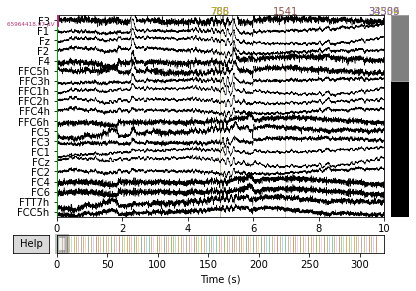

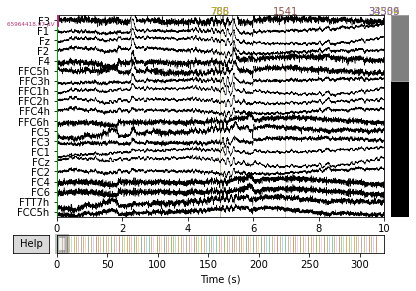

In [150]:
raw_avg_ref.pick(['eeg']).plot(scalings='auto')

Effective window size : 4.000 (s)


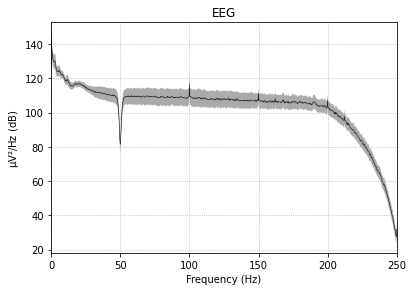

In [153]:
fig = raw_avg_ref.plot_psd(tmax=np.inf, fmax=250, average=True)
# add some arrows at 60 Hz and its harmonics:
for ax in fig.axes[:2]:
    freqs = ax.lines[-1].get_xdata()
    psds = ax.lines[-1].get_ydata()
    for freq in (60, 120, 180, 240):
        idx = np.searchsorted(freqs, freq)
        ax.arrow(x=freqs[idx], y=psds[idx] + 18, dx=0, dy=-12, color='red',
                 width=0.1, head_width=3, length_includes_head=True)

In [151]:
print(raw.info)

<Info | 8 non-empty values
 bads: []
 ch_names: F3, F1, Fz, F2, F4, FFC5h, FFC3h, FFC1h, FFC2h, FFC4h, FFC6h, ...
 chs: 61 EEG
 custom_ref_applied: True
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2015-06-23 12:45:11 UTC
 nchan: 61
 projs: []
 sfreq: 512.0 Hz
>


Effective window size : 4.000 (s)


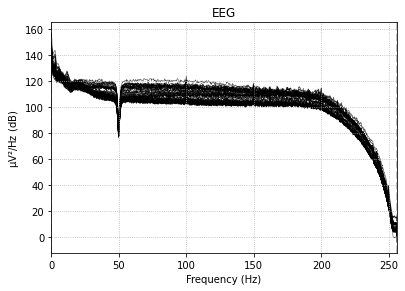

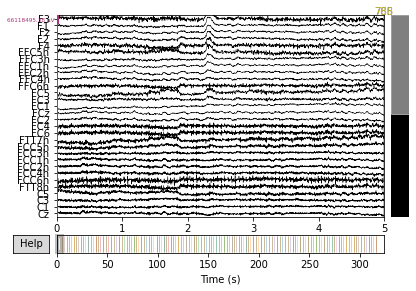

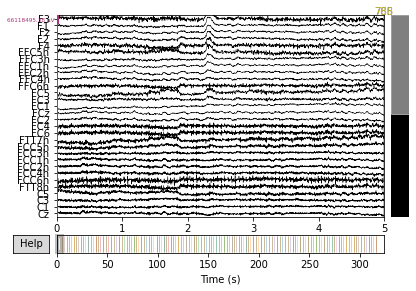

In [158]:
raw.plot_psd(fmax=256)
raw.plot(duration=5, n_channels=30, scalings='auto')

In [57]:
eog_channels = mne.pick_types(raw.info, meg=False, eog=True, eeg=False)

eog_evoked = mne.preprocessing.create_eog_epochs(raw).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()

EOG channel index for this subject is: [61 62 63]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

Now detecting blinks and generating corresponding events
No significant peaks found
Number of EOG events detected : 0


ValueError: No matching events found for 998 (event id 998)

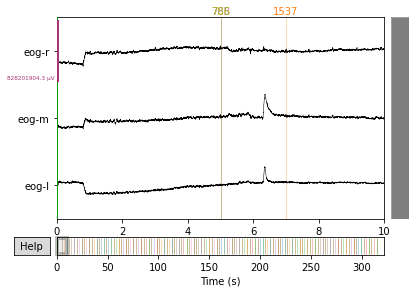

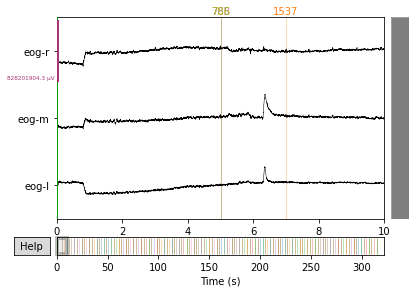

In [32]:
raw.pick(['eog']).plot(scalings='auto')

In [41]:
eog_evoked = mne.preprocessing.create_eog_epochs(raw).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()

EOG channel index for this subject is: [0 1 2]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

Now detecting blinks and generating corresponding events
No significant peaks found
Number of EOG events detected : 0


ValueError: No matching events found for 786 (event id 786)

In [15]:
eog_epochs = mne.preprocessing.create_eog_epochs(raw, baseline=(-0.5, -0.2))
eog_epochs.plot_image(combine='mean')
eog_epochs.average().plot_joint()

EOG channel index for this subject is: [61 62 63]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

Now detecting blinks and generating corresponding events
No significant peaks found
Number of EOG events detected : 0


ValueError: No matching events found for 998 (event id 998)

In [8]:
type(raw)

mne.io.edf.edf.RawGDF

In [9]:
type(raw['eeg-0'][0])

numpy.ndarray

In [10]:
raw.info.keys()

dict_keys(['acq_pars', 'acq_stim', 'ctf_head_t', 'description', 'dev_ctf_t', 'dig', 'experimenter', 'utc_offset', 'device_info', 'file_id', 'highpass', 'hpi_subsystem', 'kit_system_id', 'helium_info', 'line_freq', 'lowpass', 'meas_date', 'meas_id', 'proj_id', 'proj_name', 'subject_info', 'xplotter_layout', 'gantry_angle', 'bads', 'chs', 'comps', 'events', 'hpi_meas', 'hpi_results', 'projs', 'proc_history', 'custom_ref_applied', 'sfreq', 'dev_head_t', 'ch_names', 'nchan'])

In [11]:
print(raw.info)

<Info | 7 non-empty values
 bads: []
 ch_names: eeg-0, eeg-1, eeg-2, eeg-3, eeg-4, eeg-5, eeg-6, eeg-7, eeg-8, ...
 chs: 96 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2015-05-26 15:42:48 UTC
 nchan: 96
 projs: []
 sfreq: 512.0 Hz
>


In [12]:
tmp = raw['eeg-0'][0].flatten()

In [13]:
raw.info['sfreq']

512.0

In [86]:
plt.plot(tmp[8:])

NameError: name 'tmp' is not defined

# Preprocessing
- remove noizy channels
- Downsampled the data to 256Hz
- mark artifacts 
    1. by band-pass filter(0.3-70Hz, 4th order zero-phase Butterworth filter)
    2. find values above/below thresholds of -200uV and 200uV from data
    3. 


## Downsample
Used scipy.signal.resample()

In [126]:
raw_avg_ref.get_data(picks='eeg')[0].shape

(165872,)

In [127]:
secs = (raw_avg_ref.get_data(picks='eeg')[0]).shape[0] // int(raw.info['sfreq'])
samples = secs * 256
tmmp = signal.resample(tmp[~np.isnan(tmp)], samples)

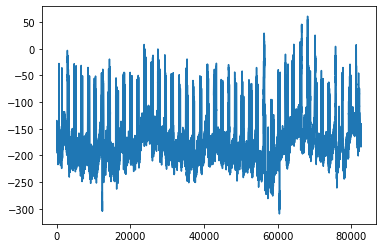

In [128]:
plt.plot(tmmp)

## Butterworth Filter
band-pass filtering (0.3 Hz—70 Hz, 4th order zero-phase Butterworth filter)


In [129]:
b, a = butter_bandpass(0.3, 3, 256, 4)

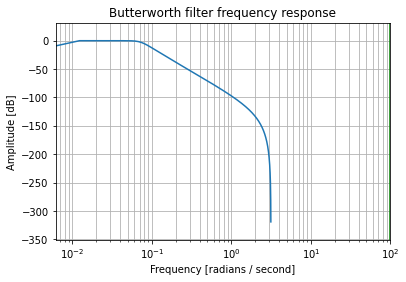

In [130]:
w, h = signal.freqz(b, a)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.show()

In [122]:
print(tmp.shape)
tmmp = tmp[~np.isnan(tmp)]
print(tmp.shape)

(165872,)
(165360,)


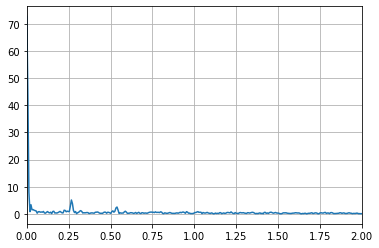

In [137]:
plot_fft(tmmp, 512)

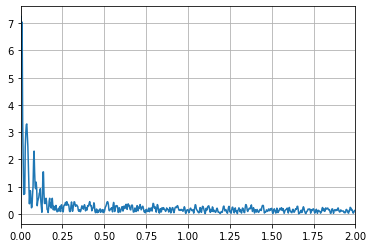

In [21]:
plot_fft(tmmp-np.mean(tmmp), 256)

In [22]:
tmmp.shape

(82432,)

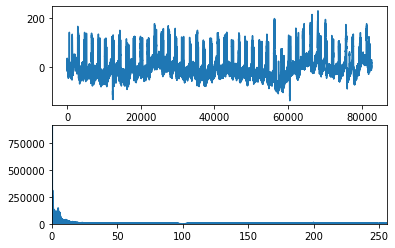

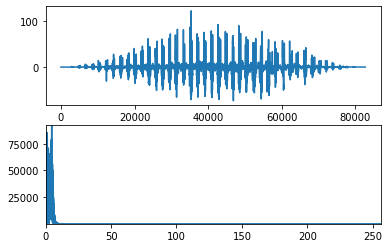

In [142]:
plot_signal_fft(tmmp-np.mean(tmmp), 512)
w_hann = signal.hann(len(tmmp))
filtered = signal.filtfilt(b, a, w_hann*tmmp-np.mean(tmmp))
plot_signal_fft(filtered, 512)

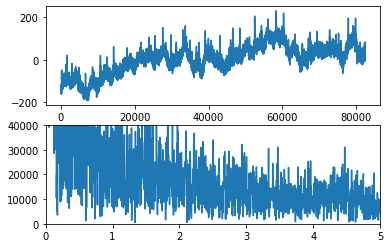

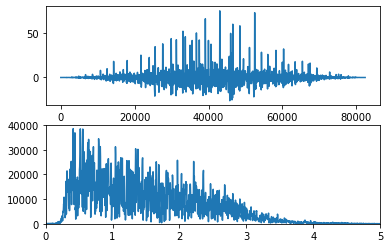

In [29]:
# plot_signal_fft(tmmp[8:-8]-np.mean(tmmp[8:-8]), 256)
# w_hann = signal.hann(len(tmmp[8:-8]))
# filtered = signal.filtfilt(b, a, w_hann*tmmp[8:-8]-np.mean(tmmp[8:-8]))
# plot_signal_fft(filtered, 256)

Next, 
Mark artifacts judged by threshold of +_ 200uV.
他の論文におけるアーティファクト対策を調べるあとから．
とりあえず飛ばして，フィルタ，re-referencing(common average reference)のあと分類！


In [ ]:
b, a = butter_bandpass(0.3, 3, 256, 4)